## InterProScan results
Notebook to look at Pfam hits in the dataset of paired structures

In [1]:
import sys
sys.path.extend(["../code/src"])
import pandas as pd
from pathlib import Path
from collections import Counter, defaultdict
import numpy as np
from Bio.PDB import PDBParser

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

from utils.fasta import parse_fasta
from utils.alignment import align,map_seq_to_alignment
from utils.structure import extract_sequence_from_chain
from utils.commands import call_dssp

from pprint import pprint
from copy import deepcopy

# Path to DSSP binary
DSSP_PATH = "/home/miguel/miniconda3/envs/general/bin/mkdssp"
out_path = Path("analysis_pfam_hits")


In [2]:
# Get sequences
pdb_pairs_df = pd.read_csv("../data/processed/pdb_pairs/filtered_df.csv")
fasta_path = "../data/processed/pdb_pairs/filtered_seqs.fasta"
with open(fasta_path) as f:
    uniprot_fasta = parse_fasta(f)

# Get Pfam scan results

df_path = "../data/processed/iprscan_pfam_hits/ipr_full_results.csv"
df = pd.read_csv(df_path)
print(len(df))

uniprot_ids = list(pdb_pairs_df["UNIPROT"].unique())
df = df.loc[df["uniprot_id"].isin(uniprot_ids)]
print("Removed filtered out proteins")
print(len(df))

# # Remove hits with an E-value above 0.01
e_cutoff = 0.01
df = df.loc[df['e_value']<e_cutoff]
print("Removed poor hits")
print(len(df))

df = df.drop_duplicates()
print("Removed duplicates")
print(len(df))


697
Removed filtered out proteins
589
Removed poor hits
575
Removed duplicates
423


In [3]:
df

,uniprot_id,pfam_id,pfam_name,start,end,e_value
0,P33981,PF00069,Protein kinase domain,525,791,3.700000e-66
1,Q16288,PF07714,Protein tyrosine and serine/threonine kinase,539,823,4.000000e-88
3,Q16288,PF13855,Leucine rich repeat,104,160,4.200000e-10
4,Q16288,PF00047,Immunoglobulin domain,215,299,5.100000e-14
5,Q16288,PF07679,Immunoglobulin I-set domain,322,391,1.200000e-04
...,...,...,...,...,...,...
690,P07515,PF00381,PTS HPr component phosphorylation site,3,82,1.400000e-27
691,O14920,PF12179,I-kappa-kinase-beta NEMO binding domain,706,742,1.500000e-12
692,O14920,PF00069,Protein kinase domain,16,290,2.300000e-50
693,O14920,PF18397,IQBAL scaffold dimerization domain,389,663,5.900000e-130


In [17]:
# Count the number of times each domain appears
counter = Counter(df["pfam_name"].tolist())
counter = {k: v for k, v in sorted(counter.items(), key=lambda item: item[1])[::-1]}
filt_counter = {k:v for k,v in counter.items() if v>2}

In [18]:
sns.set_style("whitegrid")
sns.set_context("poster")
plt.figure(figsize=(120,250))
bp = sns.barplot(y=list(filt_counter.keys()),x=list(filt_counter.values()),color='black')
bp.set_yticklabels(bp.get_yticklabels(), rotation=0,horizontalalignment='right',fontweight='medium',fontsize=100)
bp.set_xticklabels([0,10,20,30,40,50,60,70], rotation=0,horizontalalignment='right',fontsize=90)
plt.xlabel("Number of Pfam domain hits (with >2 occurrences)",fontweight='medium',fontsize=100)

#plt.savefig("barplot_pfam_hits.pdf",dpi=150,bbox_inches='tight')

sns.despine()

/tmp/ipykernel_341162/1424478528.py:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  bp.set_xticklabels([0,10,20,30,40,50,60,70], rotation=0,horizontalalignment='right',fontsize=90)


In [19]:
# How many different Pfam domains?
print(f"How many different Pfam domains? {len(counter)}")
# How many singletons?
singletons = len(counter) - len(filt_counter)
print(f"How many domains appear only once? {singletons}")

How many different Pfam domains? 214
How many domains appear only once? 161


In [22]:
kinase_descriptions = ["Protein kinase domain","Protein tyrosine and serine/threonine kinase","Polo kinase kinase"]

kinase_subset_df = df.loc[df["pfam_name"].isin(kinase_descriptions)]
# Protein kinase domain goes with protein kinase C terminal domain
# Tyrosine and serine/threonine kinase is a subclass of kinase domain, reported independently
kinases = list(kinase_subset_df["uniprot_id"].unique())
print(kinases)
print(f"How many kinases? {len(kinases)}")


['P33981', 'Q16288', 'Q13627', 'O43353', 'P19525', 'P06239', 'P05132', 'P23443', 'P17612', 'P21802', 'O15530', 'P63086', 'Q9NWZ3', 'Q9Y6E0', 'P48730', 'P11309', 'P07949', 'P43405', 'P54762', 'P10721', 'P29320', 'P49759', 'P24941', 'O75385', 'O75460', 'O14965', 'P31751', 'O96013', 'P68400', 'P04629', 'P00523', 'P12931', 'O94804', 'P9WI81', 'P52333', 'P50613', 'P07332', 'P28482', 'Q16539', 'P47811', 'P49841', 'P00519', 'P29317', 'P00517', 'O60674', 'P15056', 'P25321', 'P31749', 'P54646', 'Q13153', 'Q04759', 'Q13131', 'Q99640', 'Q9NYL2', 'Q9WV60', 'O15264', 'Q94F62', 'Q00944', 'O62305', 'P28327', 'Q9QZL0', 'P24723', 'O43293', 'Q13188', 'Q9UHD2', 'Q9UK32', 'Q05609', 'Q96RR4', 'P53778', 'Q13523', 'O43683', 'Q92630', 'P9WI83', 'D6WMX4', 'P29322', 'P27361', 'P16892', 'P22607', 'P54760', 'P41743', 'Q13882', 'P36887', 'Q92918', 'O14920', 'P11802']
How many kinases? 85


In [24]:
# Get the domains present in each protein
prot_to_domains = defaultdict(set)

for idx,row in df.iterrows():
    prot = row['uniprot_id']
    domain = row['pfam_name']
    prot_to_domains[prot].add(domain)

# Get the number of proteins with each Pfam domain
domain_counter = defaultdict(int)
for k,v in prot_to_domains.items():
    for item in v:
        domain_counter[item] += 1

domain_counter = {k: v for k, v in sorted(domain_counter.items(), key=lambda item: item[1])[::-1]}
filt_domain_counter = {k:v for k,v in domain_counter.items() if v>1}

In [25]:
sns.set_style("whitegrid")
sns.set_context("poster")
plt.figure(figsize=(120,80))
bp = sns.barplot(y=list(filt_domain_counter.keys()),x=list(filt_domain_counter.values()),color='black')
bp.set_yticklabels(bp.get_yticklabels(), rotation=0,horizontalalignment='right',fontweight='medium',fontsize=100)
bp.set_xticklabels([0,10,20,30,40,50,60,70], rotation=0,horizontalalignment='right',fontsize=90)
plt.xlabel("Number of proteins with Pfam domain (only domains with >2 occurrences)",fontweight='medium',fontsize=100)

#plt.savefig("barplot_proteins_with_pfam_domain.png",dpi=150,bbox_inches='tight')

sns.despine()

/tmp/ipykernel_341162/333150660.py:6: UserWarning: FixedFormatter should only be used together with FixedLocator
  bp.set_xticklabels([0,10,20,30,40,50,60,70], rotation=0,horizontalalignment='right',fontsize=90)


<Figure size 1000x1000 with 0 Axes>

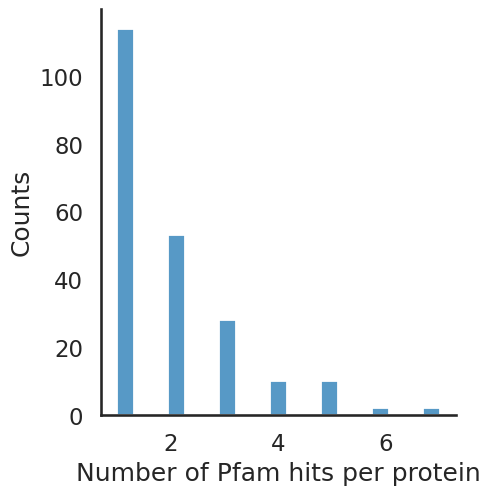

In [29]:
# Get the number of domains per protein
domain_counts = {k:len(v) for k,v in prot_to_domains.items()}

counts = list(domain_counts.values())
sns.set_style('white')
sns.set_context('talk')
plt.figure(figsize=(10,10))
ht = sns.displot(counts,kde=False)
plt.xlabel("Number of Pfam hits per protein")
plt.ylabel("Counts")
sns.despine()
plt.savefig("pfam_hits_per_protein.png",dpi=150,bbox_inches='tight')


## Where are the phosphosites?

In [35]:
# Get all phosphosites in the data
psites = set(pdb_pairs_df["PHOSPHOSITE"].unique())
# Mapping between domain names and their Pfam IDs
domain_to_pfamid = {}
for idx,row in df.iterrows():
    domain_to_pfamid[row['pfam_name']] = row['pfam_id']

In [70]:
psite_to_pfam_domain = {}
psite_to_pfam_domain_df = []
headers = ["Uniprot ID", "Phosphosite","Domain name","Pfam ID","Start","End"]

for psite in psites:
    uniprot_id, res_idx = psite.split("_")
    res_idx = int(res_idx)
    subset_df = df.loc[df["uniprot_id"]==uniprot_id]
    
    if len(subset_df) > 0:
        for idx, row in subset_df.iterrows():
            name = row['pfam_name']
            pfam_id = row['pfam_id']
            start = int(row['start'])
            end = int(row['end'])
            domain_range = [i for i in range(start,end)]
            if res_idx in domain_range:
                psite_to_pfam_domain[psite] = name
                row = [uniprot_id, psite, name, pfam_id, start, end]
                psite_to_pfam_domain_df.append(row)

psite_to_pfam_domain_df = pd.DataFrame(psite_to_pfam_domain_df,columns=headers)
psite_to_pfam_domain_df.to_csv("../data/processed/phosphosite_to_pfamdomain/filtered_psite_per_domain.tsv")

In [71]:
psite_to_pfam_domain_df

,Uniprot ID,Phosphosite,Domain name,Pfam ID,Start,End
0,Q96RR4,Q96RR4_400,Protein kinase domain,PF00069,165,446
1,P12694,P12694_337,Dehydrogenase E1 component,PF00676,106,405
2,O14965,O14965_287,Protein kinase domain,PF00069,133,383
3,Q64610,Q64610_209,Type I phosphodiesterase / nucleotide pyrophos...,PF01663,165,477
4,O75385,O75385_180,Protein kinase domain,PF00069,17,278
...,...,...,...,...,...,...
234,P12931,P12931_419,Protein tyrosine and serine/threonine kinase,PF07714,271,518
235,P05187,P05187_114,Alkaline phosphatase,PF00245,55,490
236,Q99XG5,Q99XG5_123,"DNA gyrase/topoisomerase IV, subunit A",PF00521,33,473
237,P16892,P16892_182,Protein kinase domain,PF00069,14,309


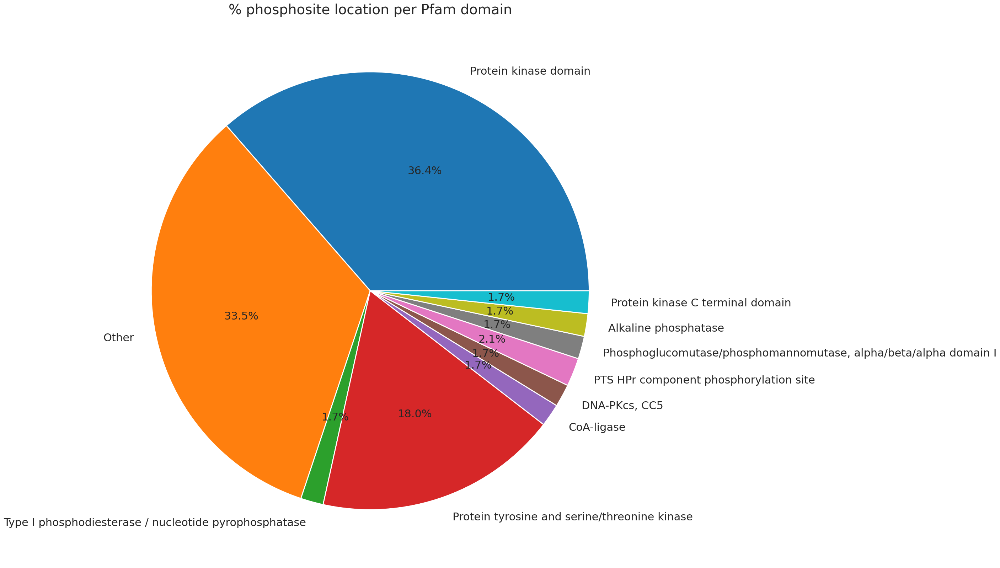

In [87]:
# Plot pie chart
psite_domains = list(psite_to_pfam_domain_df["Domain name"])

psite_domain_counter = Counter(psite_domains)
most_frequent = defaultdict(int)

for k,v in psite_domain_counter.items():
    
    if v < 4:
        most_frequent["Other"] += v
    else:
        most_frequent[k] += v


labels = list(most_frequent.keys())
values = list(most_frequent.values())

sns.set_context('poster')
plt.figure(figsize=(20,20))
patches, texts, autotexts = plt.pie(values, labels=labels, autopct='%1.1f%%',textprops={'fontsize': 22})
plt.title("% phosphosite location per Pfam domain",fontsize=28)
plt.savefig("../data/processed/phosphosite_to_pfamdomain/filtered_phosphosite_per_domain_piechart.png",dpi=150,bbox_inches='tight')


In [17]:
# How far away from Pfam domains are the phosphosites that are NOT in Pfam domains?
min_dists = []
flanking_domains = {}
at_n_terminus = {}
nterminus_dist = {}
at_c_terminus = {}
cterminus_dist = {}

for k, v in psite_to_domain.items():
    if v[0] == "NA" and not k.startswith("Q02732"):
        prot, res = k.split("_")
        res = int(res)
        prot_domains = prot_architecture[prot]
        
        i = 0
        psite_min_dist = []
        #print(prot_domains)
        for domain in prot_domains:
            
            domain_start = domain[1]
            domain_end = domain[2]
            #print(domain[0],res,domain_start,domain_end)
            dist_to_start = abs(res - domain_start)
            dist_to_end = abs(res - domain_end)
            min_dist = min([dist_to_start, dist_to_end])
            #print(min_dist)
            psite_min_dist.append(min_dist)
        
        minimum = min(psite_min_dist)
        min_idx = psite_min_dist.index(minimum)
        #print(min_idx)
        
        domain = prot_domains[min_idx]
        domain_start = domain[1]
        domain_end = domain[2]
        
        if min_idx == 0:
            
            if res < domain_start:
                #print(f"{k} at {minimum}, N-terminus")
                at_n_terminus[k] = minimum
                nterminus_dist[k] = res

            elif res > domain_end and len(prot_domains) > 1:
                #print(f"{k} at {minimum}, flanking domains")
                flanking_domains[k] = minimum

            elif res > domain_end and len(prot_domains) == 1:
                #print(f"{k} at {minimum}, C terminus")
                at_c_terminus[k] = minimum
                cterminus_dist[k] = len(uniprot_fasta[prot]) - int(res)
            
            else:
                raise Exception("Hey man you forgot something")

                
        elif min_idx == len(prot_domains) - 1:
            
            if res < domain_start and len(prot_domains) > 1:
                #print(f"{k} at {minimum}, flanking domains")
                flanking_domains[k] = minimum
                
            elif res > domain_end and len(prot_domains) > 1:
                #print(f"{k} at {minimum}, C terminus")
                at_c_terminus[k] = minimum
                cterminus_dist[k] = len(uniprot_fasta[prot]) - int(res)
                      
            else:
                raise Exception("Yo whats this")
            
        else:
            #print(f"{k} at {minimum}, flanking domains")
            flanking_domains[k] = minimum
        
        min_dists.append(minimum)
                

/home/miguel/miniconda3/envs/general/lib/python3.7/site-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


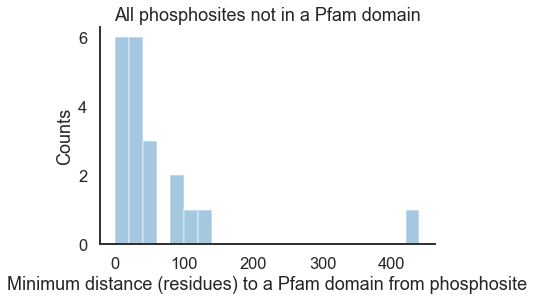

In [18]:
sns.set_context("talk")
sns.set_style("white")
sns.distplot(min_dists,kde=False,bins=list(range(0,460, 20)))
plt.xlabel("Minimum distance (residues) to a Pfam domain from phosphosite")
plt.ylabel("Counts")
plt.title("All phosphosites not in a Pfam domain")
sns.despine()
plt.savefig("histogram_psite_distance_to_pfam.png",dpi=150, bbox_inches='tight')

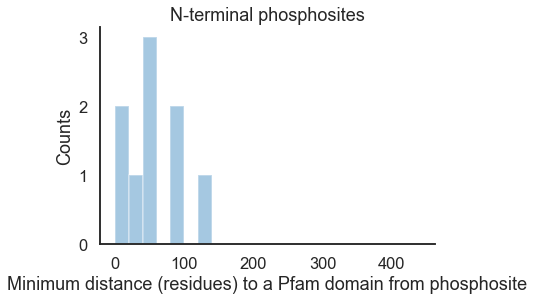

In [19]:
sns.set_context("talk")
sns.set_style("white")
sns.distplot(list(at_n_terminus.values()),kde=False,bins=list(range(0,460, 20)))
plt.xlabel("Minimum distance (residues) to a Pfam domain from phosphosite")
plt.ylabel("Counts")
plt.title("N-terminal phosphosites")
sns.despine()
plt.savefig("nterminal_psite_distance_to_pfam.png",dpi=150, bbox_inches='tight')

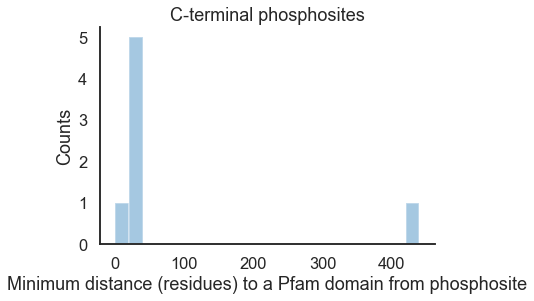

In [20]:
sns.set_context("talk")
sns.set_style("white")
sns.distplot(list(at_c_terminus.values()),kde=False,bins=list(range(0,460, 20)))
plt.xlabel("Minimum distance (residues) to a Pfam domain from phosphosite")
plt.ylabel("Counts")
plt.title("C-terminal phosphosites")
sns.despine()
plt.savefig("cterminal_psite_distance_to_pfam.png",dpi=150, bbox_inches='tight')

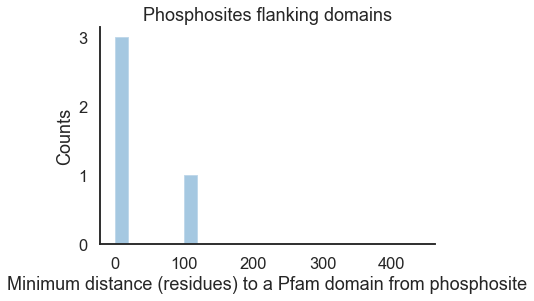

In [21]:
sns.set_context("talk")
sns.set_style("white")
sns.distplot(list(flanking_domains.values()),kde=False,bins=list(range(0,460, 20)))
plt.xlabel("Minimum distance (residues) to a Pfam domain from phosphosite")
plt.ylabel("Counts")
plt.title("Phosphosites flanking domains")

sns.despine()
plt.savefig("flanking_psite_distance_to_pfam.png",dpi=150, bbox_inches='tight')

Median distance to C-terminus 12.0


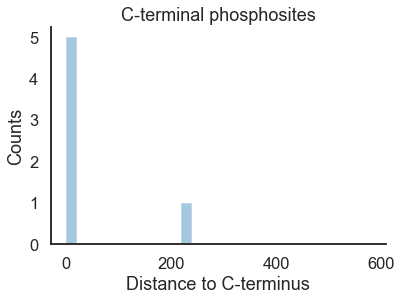

In [22]:
sns.set_context("talk")
sns.set_style("white")
sns.distplot(list(cterminus_dist.values()),kde=False,bins=list(range(0,600, 20)))

plt.xlabel("Distance to C-terminus")
plt.ylabel("Counts")
plt.title("C-terminal phosphosites")
sns.despine()
plt.savefig("cterminal_psite_distance_to_cterminus.png",dpi=150, bbox_inches='tight')
print(f"Median distance to C-terminus {np.median(list(cterminus_dist.values()))}")

Median distance to N-terminus 22.0


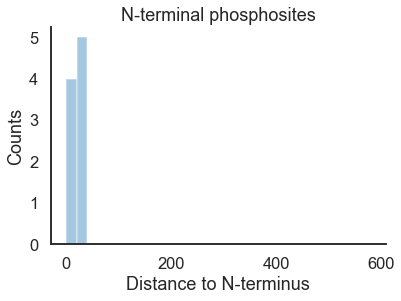

In [23]:
sns.set_context("talk")
sns.set_style("white")
sns.distplot(list(nterminus_dist.values()),kde=False,bins=list(range(0,600, 20)))
plt.xlabel("Distance to N-terminus")
plt.ylabel("Counts")
plt.title("N-terminal phosphosites")
sns.despine()
plt.savefig("nterminal_psite_distance_to_nterminus.png",dpi=150, bbox_inches='tight')
print(f"Median distance to N-terminus {np.median(list(nterminus_dist.values()))}")

In [24]:
df_dict = {}

i = 0
for v in at_n_terminus.values():
    df_dict[i] = {"Distance":v,"Group":"N-terminal"}
    i += 1
for v in at_c_terminus.values():
    df_dict[i] = {"Distance":v,"Group":"C-terminal"}
    i += 1

for v in flanking_domains.values():
    df_dict[i] = {"Distance":v,"Group":"Domain flanking"}
    i += 1

dist_df = pd.DataFrame.from_dict(df_dict,orient="index")


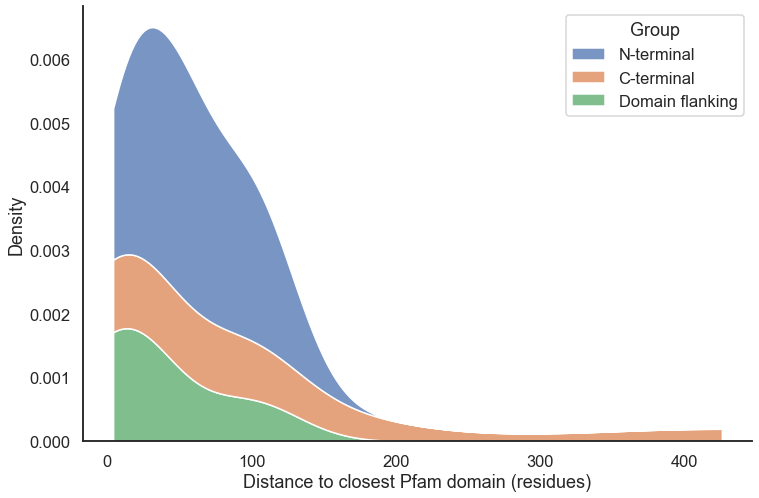

In [25]:
sns.set()
sns.set_context("talk")
sns.set_style("white")
plt.figure(figsize=(12,8))
sns.kdeplot(data=dist_df, x="Distance", hue="Group",cut=0,multiple='stack')
plt.xlabel("Distance to closest Pfam domain (residues)")
sns.despine()

<Figure size 1080x1440 with 0 Axes>

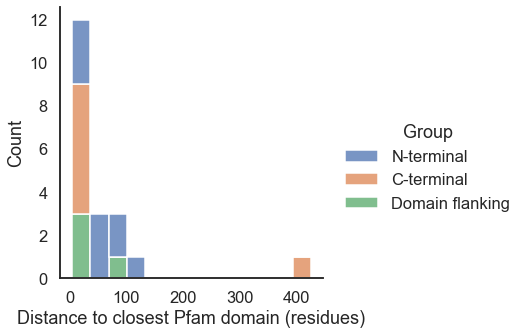

In [26]:
sns.set()
sns.set_context("talk")
sns.set_style("white")
plt.figure(figsize=(15,20))
sns.displot(data=dist_df, x="Distance", hue="Group",multiple='stack')
plt.xlabel("Distance to closest Pfam domain (residues)")
sns.despine()
plt.savefig("histogram_distance_to_pfam_domains.png",dpi=150,bbox_inches='tight')


In [27]:
terminus_dict = {}

i = 0
for v in nterminus_dist.values():
    terminus_dict[i] = {"Distance":v,"Group":"N-terminal"}
    i += 1
for v in cterminus_dist.values():
    terminus_dict[i] = {"Distance":v,"Group":"C-terminal"}
    i += 1

terminus_df = pd.DataFrame.from_dict(terminus_dict,orient="index")


<Figure size 1080x1440 with 0 Axes>

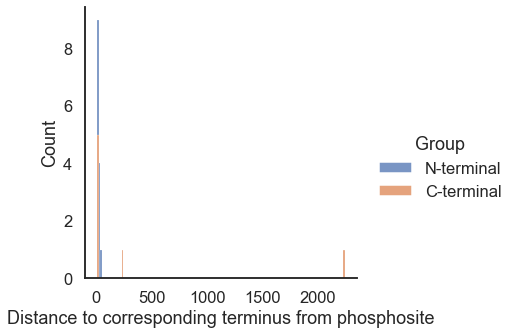

In [28]:
sns.set()
sns.set_context("talk")
sns.set_style("white")
plt.figure(figsize=(15,20))
sns.displot(data=terminus_df, x="Distance", hue="Group",multiple='stack')
plt.xlabel("Distance to corresponding terminus from phosphosite")
sns.despine()
